In [23]:
import adsb_util
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import gaussian_kde


In [2]:
flightVectors = adsb_util.pfs('adsb_data/20181210_jfk24h')

In [3]:
flightDf = adsb_util.tdf(flightVectors)

In [4]:
flightDf.head()


,Id,Lat,Long,Flighttime,Stationtime,Latency,Altitude
0,10530047,40.794000,-74.089100,1544457946729,1544457951277,4548,2775
1,10530047,40.803100,-74.101700,1544458052704,1544458081476,28772,2800
2,10530047,40.718591,-74.140611,1544493754685,1544493763432,8747,2200
3,10530047,40.718591,-74.140611,1544493754862,1544493828427,73565,3800
4,10530047,40.826359,-74.079874,1544534839419,1544534846121,6702,2425


In [5]:
flightDf = adsb_util.clean(flightDf)
flightDf[flightDf.Latency > 0].count()

Id             37562
Lat            37562
Long           37562
Flighttime     37562
Stationtime    37562
Latency        37562
Altitude       37562
dtype: int64

In [6]:
flightDf.describe()

,Id,Lat,Long,Flighttime,Stationtime,Latency,Altitude
count,3.756200e+04,37562.000000,37562.000000,3.756200e+04,3.756200e+04,3.756200e+04,37562.000000
mean,1.044155e+07,40.666410,-73.841964,1.544495e+12,1.544496e+12,1.010588e+06,5007.378308
std,2.052624e+06,0.105522,0.147512,2.552420e+07,2.595595e+07,3.652108e+06,11675.777836
min,4.529400e+04,40.345893,-74.170349,1.544450e+12,1.544458e+12,1.000000e+00,-1200.000000
25%,1.063165e+07,40.628157,-73.930374,1.544474e+12,1.544475e+12,1.421000e+03,-175.000000
50%,1.095943e+07,40.648320,-73.823743,1.544489e+12,1.544490e+12,5.530000e+03,1200.000000
75%,1.127764e+07,40.746755,-73.769276,1.544513e+12,1.544522e+12,8.900300e+04,4175.000000
max,1.522084e+07,40.938200,-73.391200,1.544544e+12,1.544544e+12,3.951185e+07,123400.000000


In [7]:
flightDf['Latency'].max()

39511848

<AxesSubplot:>

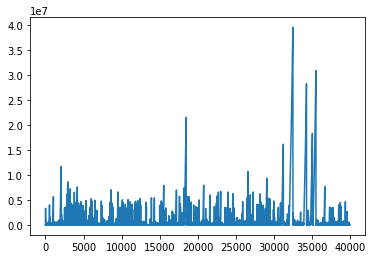

In [8]:
flightDf['Latency'].plot()

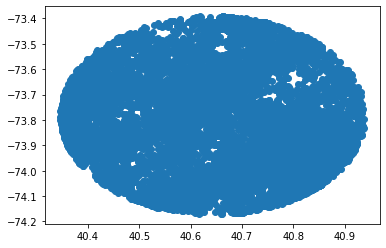

In [9]:
plt.scatter(flightDf['Lat'], flightDf['Long'])
plt.show()

In [10]:
# Plot of atltitude and latency

altDf = flightDf[['Altitude', 'Latency']]
print(altDf[altDf.Altitude > 0].count())
altDf = altDf[altDf.Altitude > 0] 
altDf.describe()


Altitude    24304
Latency     24304
dtype: int64


,Altitude,Latency
count,24304.000000,2.430400e+04
mean,7839.745351,9.383168e+05
std,13709.916466,3.870336e+06
min,17.000000,1.000000e+00
25%,1275.000000,9.350000e+02
50%,2775.000000,2.663000e+03
75%,8100.000000,1.032400e+04
max,123400.000000,3.567781e+07


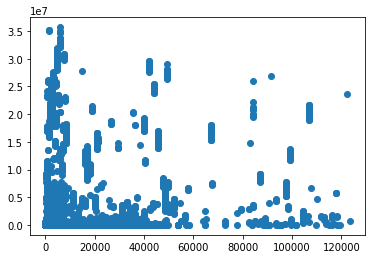

In [11]:
plt.scatter(altDf['Altitude'], altDf['Latency'])
plt.show()
# Random distribution

In [12]:
def cov(df, fx, fy):
    ux = df[fx].mean()
    uy = df[fy].mean()

    return ((df[fx] - ux) * (df[fy] - uy)).mean()

def rho(df, fx, fy):
    return cov(df, fy, fx)/(df[fx].var() * df[fy].var())




In [13]:

# There is no correlation between 'Altitude' and 'Latency'
cov(altDf, 'Altitude', 'Latency')
rho(altDf, 'Altitude', 'Latency')



5.079632092067935e-12

In [14]:
posDf = flightDf[['Lat', 'Long', 'Latency']]

posDf.describe()

,Lat,Long,Latency
count,37562.000000,37562.000000,3.756200e+04
mean,40.666410,-73.841964,1.010588e+06
std,0.105522,0.147512,3.652108e+06
min,40.345893,-74.170349,1.000000e+00
25%,40.628157,-73.930374,1.421000e+03
50%,40.648320,-73.823743,5.530000e+03
75%,40.746755,-73.769276,8.900300e+04
max,40.938200,-73.391200,3.951185e+07


In [38]:
posDf['OriginDist'] = (posDf['Lat'] * posDf['Lat'] + posDf['Long'] * posDf['Long']).apply(np.sqrt)

posDf.describe()
# flightDf[sqrt(flightDf.Lat * flightDf.Lat + flightDf.Long * flightDf.Long)]

<ipython-input-38-d69138be027d>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  posDf['OriginDist'] = (posDf['Lat'] * posDf['Lat'] + posDf['Long'] * posDf['Long']).apply(np.sqrt)


,Lat,Long,Latency,OriginDist
count,37562.000000,37562.000000,3.756200e+04,37562.000000
mean,40.666410,-73.841964,1.010588e+06,84.299492
std,0.105522,0.147512,3.652108e+06,0.145323
min,40.345893,-74.170349,1.000000e+00,83.864259
25%,40.628157,-73.930374,1.421000e+03,84.222888
50%,40.648320,-73.823743,5.530000e+03,84.249425
75%,40.746755,-73.769276,8.900300e+04,84.400511
max,40.938200,-73.391200,3.951185e+07,84.605920


<AxesSubplot:>

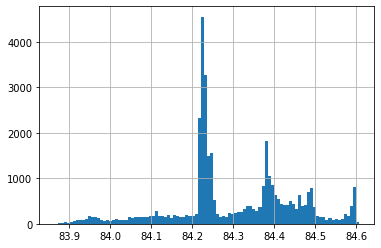

In [47]:
posDf['OriginDist'].hist(bins=100)

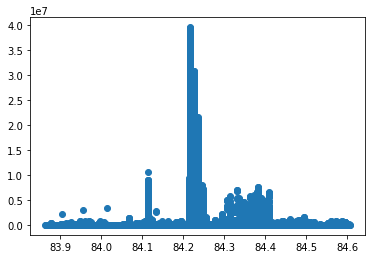

In [54]:
plt.scatter(posDf['OriginDist'], posDf['Latency'])
plt.show()

In [48]:

rho(posDf, 'OriginDist', 'Latency')

# No seemingly valuable relationship

-2.149237253811055e-07